In [1]:
import numpy as np 
import pandas as pd 

import itertools
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn import metrics 
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv("data.csv")
df.drop(columns=["Unnamed: 32"], inplace=True)
class_names = df.diagnosis.unique()
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


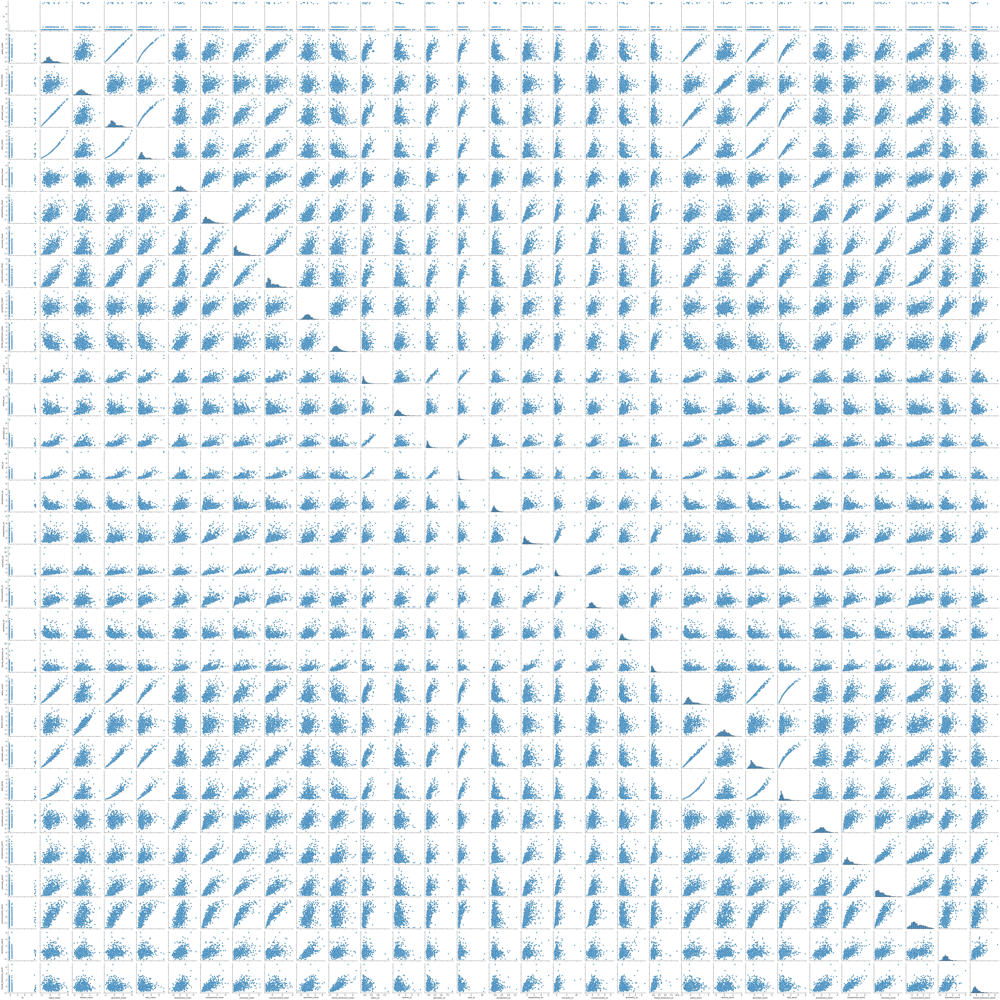

In [5]:
col = ["diagnosis"]
d = df

num_cols = d.columns[d.dtypes.apply(lambda c: np.issubdtype(c, np.number))]

scaler = StandardScaler()
d[num_cols] = scaler.fit_transform(d[num_cols])
columns = d.columns
sns.pairplot(d);

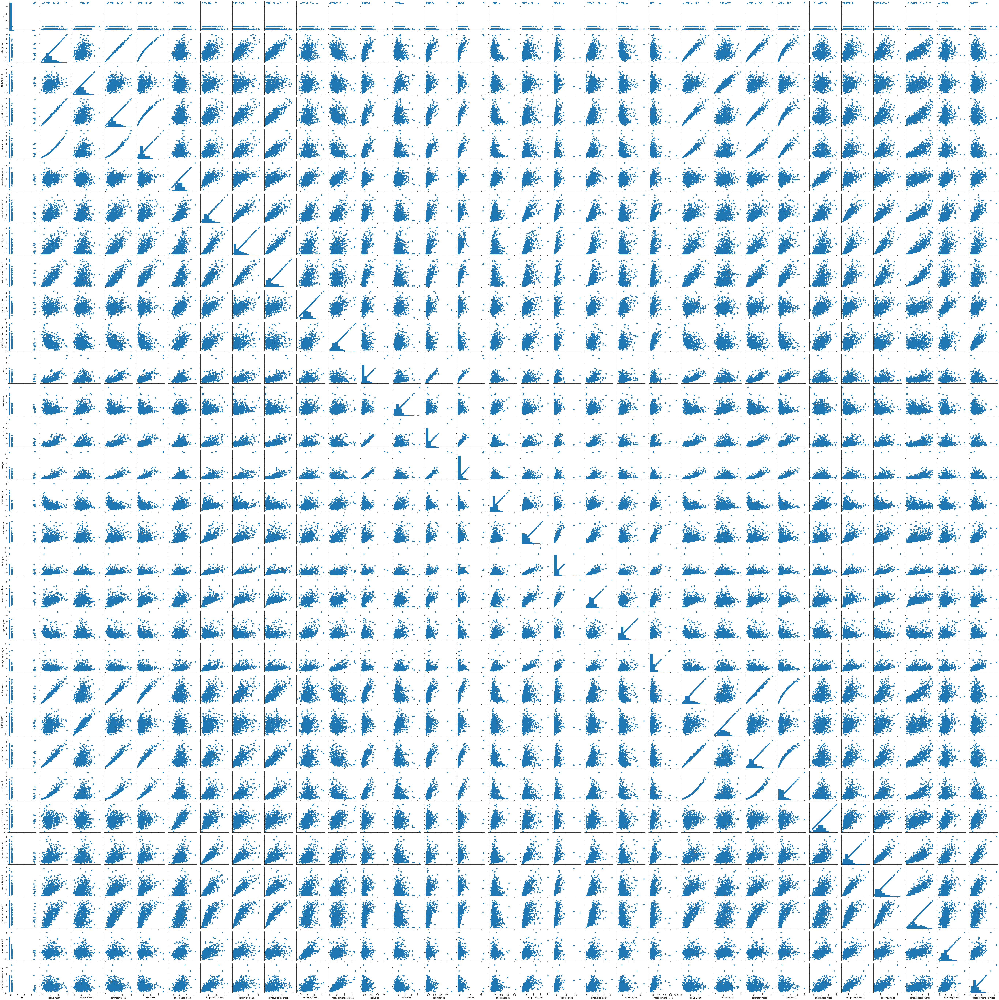

In [6]:
g = sns.PairGrid(
    d, 
    diag_sharey=True, 
    height=2.5, 
    aspect=1, 
    despine=True, 
    dropna=False)
g = g.map(plt.scatter)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter);

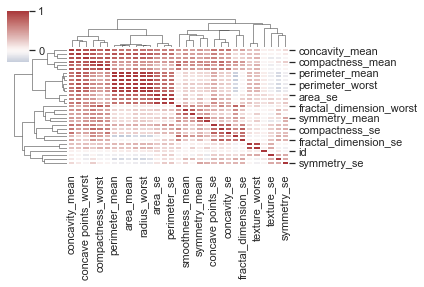

In [7]:
sns.set(style="white")
sns.clustermap(d.corr(), 
               pivot_kws=None, 
               z_score=None, 
               standard_scale=None,
               figsize=None,
               cbar_kws=None, 
               row_cluster=True, 
               col_cluster=True, 
               row_linkage=None, 
               col_linkage=None,
               row_colors=None, 
               col_colors=None, 
               mask=None,
               center=0,
               cmap="vlag",
               linewidths=.75)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5]),
 [Text(0.5, 0, 'id'),
  Text(1.5, 0, 'radius_mean'),
  Text(2.5, 0, 'texture_mean'),
  Text(3.5, 0, 'perimeter_mean'),
  Text(4.5, 0, 'area_mean'),
  Text(5.5, 0, 'smoothness_mean'),
  Text(6.5, 0, 'compactness_mean'),
  Text(7.5, 0, 'concavity_mean'),
  Text(8.5, 0, 'concave points_mean'),
  Text(9.5, 0, 'symmetry_mean'),
  Text(10.5, 0, 'fractal_dimension_mean'),
  Text(11.5, 0, 'radius_se'),
  Text(12.5, 0, 'texture_se'),
  Text(13.5, 0, 'perimeter_se'),
  Text(14.5, 0, 'area_se'),
  Text(15.5, 0, 'smoothness_se'),
  Text(16.5, 0, 'compactness_se'),
  Text(17.5, 0, 'concavity_se'),
  Text(18.5, 0, 'concave points_se'),
  Text(19.5, 0, 'symmetry_se'),
  Text(20.5, 0, 'fractal_dimension_se'),
  Text(21.5, 0, 'radius_worst'),
  Text(22.5, 0, 'texture_worst'),
  Text(23.5, 0, 'p

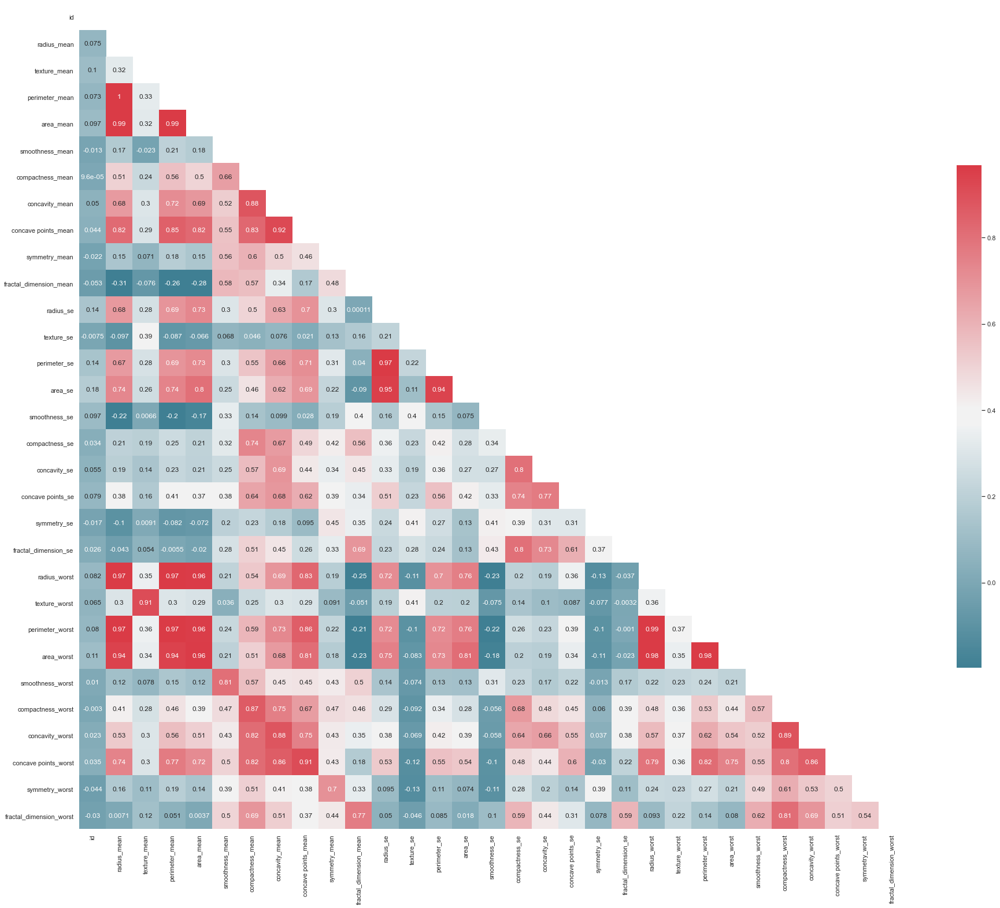

In [8]:
corr = d.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True


f, ax = plt.subplots(figsize=(len(columns), len(columns)))

cmap = sns.diverging_palette(h_neg=220, h_pos=10, s=75, l=50, sep=10, n=len(columns), center='light', as_cmap=True)

sns.set(style="white")
sns.heatmap(corr,
         vmin=None,
         vmax=None,
         cmap=cmap,
         center=None,
         robust=True,
         annot=True, 
         annot_kws=None, 
         cbar=True,
         cbar_kws={"shrink": .5},
         cbar_ax=None, 
         square=True, 
         xticklabels='auto',
         yticklabels='auto', 
         mask=mask, 
         ax=None)


plt.yticks(rotation=0)
plt.xticks(rotation=90)

In [9]:
target_val = set(df["diagnosis"])
m = {i:v for v,i in enumerate(target_val)}
df["diagnosis"] = df["diagnosis"].map(m)

df.dropna()
y = df["diagnosis"]
X = df.drop(columns=["id", "diagnosis"])

X = X.values
y = y.values

In [10]:
def print_performance(model, X_test, y_test, class_names):
    preds = model.predict(X_test)
    classification_report = metrics.classification_report(y_test, preds)
    confusion_matrix = metrics.confusion_matrix(y_test, preds)
    f1_score_ = metrics.f1_score(y_test, preds, average="weighted")

    
    print("-"*55)
    print("Performance")
    print("-"*55)
    print("{} : {:.4f} ".format("F1 Score                        ", f1_score_))
    print(classification_report)
    
    print("-"*55)
    print("\n\n")
    
    np.set_printoptions(precision=2)

    plt.figure()
    plot_confusion_matrix(confusion_matrix, classes=class_names,
                          title='Confusion matrix, without normalization')

    plt.figure()
    plot_confusion_matrix(confusion_matrix, classes=class_names, normalize=True,
                          title='Normalized confusion matrix')

    plt.show()
    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
    
def print_performance_grid(clf):

    print("{}".format("Performance"))
    print("*"*90)
    print("Score            : {}".format(clf.score(X, y)))
    print("Best Estimator   : {}".format(clf.best_estimator_))
    print("Best Score       : {}".format(clf.best_score_))
    print("Best Params      : {}".format(clf.best_params_))
    print("Best Index       : {}".format(clf.best_index_))
    print("Refit Time       : {}".format(clf.refit_time_))

    params = clf.get_params()
    best_estimator = clf.best_estimator_
    cv_results = clf.cv_results_
    
    return params, best_estimator, cv_results

In [15]:
parameters = {'kernel':('linear', 'rbf'), 
              'degree': [1, 10],
              'C': [1, 10]}

svc = svm.SVC(C=1.0,
    kernel='rbf',
    degree=3, 
    gamma='auto',
    coef0=0.0,
    shrinking=True, 
    probability=False,
    tol=0.001,
    cache_size=200,
    class_weight=None, 
    verbose=False,
    max_iter=-1, 
    decision_function_shape='ovr',
    random_state=None)


svc = svm.SVC(gamma='auto')

clf = GridSearchCV(estimator=svc, 
                   param_grid=parameters,
                   scoring=None, 
                   n_jobs=None,
                   refit=True,
                   cv=5,
                   verbose=0,
                   return_train_score='warn')

clf.fit(X, y)
 
params, best_estimator, cv_results = print_performance_grid(clf)

Performance
******************************************************************************************
Score            : 0.9912126537785588
Best Estimator   : SVC(C=10, degree=1, gamma='auto')
Best Score       : 0.9771774569166279
Best Params      : {'C': 10, 'degree': 1, 'kernel': 'rbf'}
Best Index       : 5
Refit Time       : 0.015622854232788086


In [18]:
parameters = {'kernel':('linear', 'rbf'), 
              'degree': np.arange(1, 10),
              'C': np.arange(1, 10)}

svc = svm.SVC(C=1.0,
    kernel='rbf',
    degree=3, 
    gamma='auto',
    coef0=0.0,
    shrinking=True, 
    probability=False,
    tol=0.001,
    cache_size=200,
    class_weight=None, 
    verbose=False,
    max_iter=-1, 
    decision_function_shape='ovr',
    random_state=None)


svc = svm.SVC(gamma='auto')

clf = GridSearchCV(estimator=svc, 
                   param_grid=parameters,
                   scoring=None, 
                   n_jobs=-1,
                   refit=True,
                   cv=5,
                   verbose=1,
                   return_train_score='warn')


clf.fit(X, y)

params, best_estimator, cv_results = print_performance_grid(clf)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
Performance
******************************************************************************************
Score            : 0.9894551845342706
Best Estimator   : SVC(C=6, degree=1, gamma='auto')
Best Score       : 0.9806862288464524
Best Params      : {'C': 6, 'degree': 1, 'kernel': 'rbf'}
Best Index       : 91
Refit Time       : 0.011968851089477539


In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

svc = svm.SVC(C=4, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=1, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


clf = svc

print("Cross Val Score            : {}".format(cross_val_score(clf, X, y, cv=5)))

clf.fit(X_train, y_train)
print("Score (training data only) : {}".format(clf.score(X_train, y_train)))

y_pred = clf.predict(X_test)
print("F-1 Score                  : {}".format(f1_score(y_test, y_pred, average='weighted')))

Cross Val Score            : [0.97368421 0.97368421 0.98245614 0.97368421 0.99115044]
Score (training data only) : 0.989010989010989
F-1 Score                  : 0.9912133978913833


SVM
-------------------------------------------------------
Performance
-------------------------------------------------------
F1 Score                         : 0.9912 
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        67
           1       1.00      0.98      0.99        47

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

-------------------------------------------------------



Confusion matrix, without normalization
[[67  0]
 [ 1 46]]
Normalized confusion matrix
[[1.   0.  ]
 [0.02 0.98]]


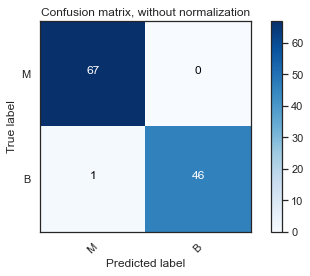

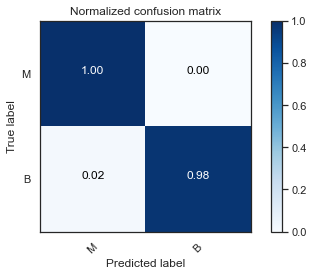

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

print("SVM")
model = clf
model.fit(X_train, y_train)
print_performance(model, X_test, y_test, class_names)